# load packages

In [1]:
# scanpy packages 
import scanpy as sc
import scanpy.external as sce
import anndata as anndata
#import diffxpy.api as de
from anndata import AnnData

# other packages
import time
import os
import numpy as np
import seaborn as sns
import pandas as pd
import re
import h5py
import scipy

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.patches as patches
import matplotlib.colors as colors
import matplotlib.font_manager
%matplotlib inline


# other packages
import glob
from collections import OrderedDict
from scipy.sparse import csr_matrix
#import diffxpy.api as de
from scanpy.external.pp import magic
from scipy.stats import zscore
import scipy.cluster.hierarchy as hc
from statistics import median
import math
from typing import Union
import phenograph

from scrnaseq_preprocessing_utils import *


In [2]:
#set style
sns.set_style('white')
# define colors
color_map_clusters = ["#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059",
"#FFDBE5", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
"#5A0007", "#809693", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
"#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
"#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
"#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
"#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
"#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
"#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
"#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
"#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
"#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
"#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C"]

color_map_clusters_nogrey = ["#FFFF00", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
"#5A0007", "#809693", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
"#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
"#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
"#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
"#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
"#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
"#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
"#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
"#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
"#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
"#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72", "#6A3A4C"]

perturbation_map = ['#EFD060','#0289DE','#0289DE','#DCA6C4']
stage_map = ['#EFD060','#0289DE','#67C6F8','#DCA6C4']
stage_map_2 = ['#EFD060','#0289DE','#DCA6C4']
blue_red = ['#0E518F','#DF480F']
perturbation_stage_map_2 = ['#F95957', '#FF0300','#EFD060','#0289DE','#0289DE','#DCA6C4','#EFD060','#0289DE','#DCA6C4']
perturbation_stage_map = ['#F95957', '#FF0300','#e1e1e1','#e1e1e1','#e1e1e1','#e1e1e1', '#EFD060','#0289DE','#DCA6C4']
color_map_clusters_plt = cm = LinearSegmentedColormap.from_list(
        'color_map_clusters', color_map_clusters)

#scanpy layout
sc.set_figure_params(scanpy=True, dpi=80, dpi_save=80, frameon=False, vector_friendly=True, fontsize=7, figsize=None, color_map=None, format='pdf', facecolor=None, transparent=True, ipython_format='png2x')
sns.set_style('white')

In [3]:
#run this notebook with every immune cell subset 'TNK', 'B', 'M' individually

# attach obs and .raw element to scran normalized subset data

## load data

In [12]:
adata_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran.h5ad'
adata_raw_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_leukocytes_scran_clustered_annotated_imputed_hvg10000_and_marker_genes_imputed_B.h5ad' # adata of all TIL containing raw counts 
save_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts.h5ad'

#parameters
save_adata =True

In [13]:
#load subset files
adata = sc.read(adata_path)
adata_raw = sc.read(adata_raw_path)

In [14]:
adata_raw

AnnData object with n_obs × n_vars = 5006 × 18116
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'batch', 'primary_tumor', 'Limited', 'PValue_emptydrops', 'FDR_emptydrops', 'total_molecules', 'percent_mito', 'empty_droplet_sig', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k20', 'pheno_var_k30', 'pheno_var_k40', 'pheno_var_k50', 'pheno_var_k60', 'pheno_var_k70', 'pheno_var_k80', 'pheno_var_k90', 'pheno_var_k100'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'major_subsets_colors', 'neighbors', 'pca',

In [15]:
print(adata_raw.X)

[[0.        0.        0.        ... 0.        0.        0.       ]
 [0.        2.4775531 0.        ... 0.        0.        0.       ]
 [0.        0.        1.0069479 ... 0.        0.        0.       ]
 ...
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]
 [0.        0.        0.        ... 0.        0.        0.       ]]


In [16]:
adata_raw.X = adata_raw.raw[adata_raw.obs_names, adata_raw.var_names].X

In [17]:
print(adata_raw.X)

  (0, 217)	1.0
  (0, 5864)	1.0
  (0, 11564)	2.0
  (0, 3684)	1.0
  (0, 14893)	1.0
  (0, 14709)	2.0
  (0, 16673)	1.0
  (0, 13503)	1.0
  (0, 7051)	3.0
  (0, 2823)	1.0
  (0, 3788)	1.0
  (0, 4604)	1.0
  (0, 1682)	1.0
  (0, 4543)	1.0
  (0, 8584)	1.0
  (0, 2909)	2.0
  (0, 10595)	1.0
  (0, 16655)	2.0
  (0, 974)	1.0
  (0, 9271)	1.0
  (0, 2065)	1.0
  (0, 9218)	1.0
  (0, 9208)	1.0
  (0, 1335)	2.0
  (0, 1332)	1.0
  :	:
  (5005, 1542)	1.0
  (5005, 2576)	2.0
  (5005, 12284)	2.0
  (5005, 17023)	1.0
  (5005, 13929)	1.0
  (5005, 16681)	1.0
  (5005, 2594)	25.0
  (5005, 10808)	1.0
  (5005, 710)	1.0
  (5005, 4832)	1.0
  (5005, 5661)	1.0
  (5005, 15078)	1.0
  (5005, 16235)	1.0
  (5005, 13572)	9.0
  (5005, 13928)	1.0
  (5005, 11561)	1.0
  (5005, 2596)	1.0
  (5005, 11893)	2.0
  (5005, 3429)	1.0
  (5005, 13484)	1.0
  (5005, 14375)	1.0
  (5005, 2623)	1.0
  (5005, 12033)	1.0
  (5005, 2869)	1.0
  (5005, 2608)	1.0


### subset raw_adata and store in X element of immune subset data

In [18]:
adata_raw.obs_names

Index(['204765448821084-T12', '195546194827510-T01', '191647290674460-T15',
       '121276815071078-T15', '130134889130915-T01', '161889610578155-T16',
       '131097947486940-T01', '200994245168435-T01', '235763079461611-T03',
       '161548575402867-T12',
       ...
       '240498395998003-T16', '131293483551588-T16', '131310502136606-T15',
       '204358259698398-T16', '241098904684916-T02', '231280294680412-T15',
       '121965727401692-T15', '169158855313251-T23', '235122023381406-T15',
       '227846602995501-T06'],
      dtype='object', length=5006)

In [19]:
adata.obs_names

Index(['204765448821084-T12', '195546194827510-T01', '191647290674460-T15',
       '121276815071078-T15', '130134889130915-T01', '161889610578155-T16',
       '131097947486940-T01', '200994245168435-T01', '235763079461611-T03',
       '161548575402867-T12',
       ...
       '240498395998003-T16', '131293483551588-T16', '131310502136606-T15',
       '204358259698398-T16', '241098904684916-T02', '231280294680412-T15',
       '121965727401692-T15', '169158855313251-T23', '235122023381406-T15',
       '227846602995501-T06'],
      dtype='object', length=4832)

In [20]:
adata.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes
204765448821084-T12,750,6.621406,1476.316284,7.297982,15.503906,26.970620,43.543475,75.852968
195546194827510-T01,366,5.905362,1180.375732,7.074435,21.954982,37.991952,61.818366,100.000016
191647290674460-T15,1093,6.997596,1728.791016,7.455756,14.024083,24.980022,38.486332,61.545289
121276815071078-T15,1122,7.023759,1745.685791,7.465476,15.546166,27.468869,40.870927,62.819470
130134889130915-T01,359,5.886104,1141.042236,7.040574,23.014783,39.724475,63.891374,100.000000
...,...,...,...,...,...,...,...,...
231280294680412-T15,1536,7.337588,1927.312500,7.564401,14.304353,25.220693,37.918075,58.674426
121965727401692-T15,663,6.498282,1445.457031,7.276873,17.323983,30.822015,47.636348,81.565286
169158855313251-T23,542,6.297109,1300.097290,7.170963,19.497177,33.516363,52.103403,94.117968
235122023381406-T15,788,6.670766,1555.011597,7.349881,17.003355,29.636985,45.516675,73.821467


In [21]:
#add raw counts
adata_raw_subset = adata_raw[adata.obs_names, adata.var_names]
adata_raw_subset

View of AnnData object with n_obs × n_vars = 4832 × 14068
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'batch', 'primary_tumor', 'Limited', 'PValue_emptydrops', 'FDR_emptydrops', 'total_molecules', 'percent_mito', 'empty_droplet_sig', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k20', 'pheno_var_k30', 'pheno_var_k40', 'pheno_var_k50', 'pheno_var_k60', 'pheno_var_k70', 'pheno_var_k80', 'pheno_var_k90', 'pheno_var_k100'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'major_subsets_colors', 'neighbors'

In [22]:
print(adata_raw_subset.X)

  (0, 124)	1.0
  (0, 4602)	1.0
  (0, 9155)	2.0
  (0, 2825)	1.0
  (0, 11384)	1.0
  (0, 11232)	2.0
  (0, 12794)	1.0
  (0, 10238)	1.0
  (0, 5547)	3.0
  (0, 2196)	1.0
  (0, 2892)	1.0
  (0, 3569)	1.0
  (0, 1293)	1.0
  (0, 3522)	1.0
  (0, 6628)	1.0
  (0, 2251)	2.0
  (0, 8324)	1.0
  (0, 12776)	2.0
  (0, 683)	1.0
  (0, 7239)	1.0
  (0, 1592)	1.0
  (0, 7186)	1.0
  (0, 7176)	1.0
  (0, 999)	2.0
  (0, 996)	1.0
  :	:
  (4831, 1177)	1.0
  (4831, 1980)	2.0
  (4831, 9778)	2.0
  (4831, 13103)	1.0
  (4831, 10606)	1.0
  (4831, 12801)	1.0
  (4831, 1998)	25.0
  (4831, 8510)	1.0
  (4831, 483)	1.0
  (4831, 3766)	1.0
  (4831, 4434)	1.0
  (4831, 11535)	1.0
  (4831, 12499)	1.0
  (4831, 10306)	9.0
  (4831, 10605)	1.0
  (4831, 9152)	1.0
  (4831, 2000)	1.0
  (4831, 9447)	2.0
  (4831, 2688)	1.0
  (4831, 10222)	1.0
  (4831, 10966)	1.0
  (4831, 2027)	1.0
  (4831, 9569)	1.0
  (4831, 2225)	1.0
  (4831, 2012)	1.0


In [23]:
adata_raw_subset

View of AnnData object with n_obs × n_vars = 4832 × 14068
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'batch', 'primary_tumor', 'Limited', 'PValue_emptydrops', 'FDR_emptydrops', 'total_molecules', 'percent_mito', 'empty_droplet_sig', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k20', 'pheno_var_k30', 'pheno_var_k40', 'pheno_var_k50', 'pheno_var_k60', 'pheno_var_k70', 'pheno_var_k80', 'pheno_var_k90', 'pheno_var_k100'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'major_subsets_colors', 'neighbors'

In [24]:
adata_raw_subset.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,batch,primary_tumor,...,pheno_var_k10,pheno_var_k20,pheno_var_k30,pheno_var_k40,pheno_var_k50,pheno_var_k60,pheno_var_k70,pheno_var_k80,pheno_var_k90,pheno_var_k100
204765448821084-T12,752,6.624065,1299.161133,7.170243,16.334959,28.160574,44.846940,76.420826,T12,True,...,24,16,17,15,13,13,13,14,12,13
195546194827510-T01,370,5.916202,1100.063110,7.004032,22.307762,38.326566,61.712728,99.999988,T01,True,...,3,4,3,6,8,6,4,6,6,6
191647290674460-T15,1096,7.000334,1588.617676,7.371249,14.600178,25.887956,39.510154,62.222444,T15,True,...,3,4,3,6,8,6,4,6,6,6
121276815071078-T15,1125,7.026427,1579.714355,7.365632,16.375858,28.776930,42.306972,63.798053,T15,True,...,3,4,3,6,8,6,4,6,6,6
130134889130915-T01,359,5.886104,1114.135620,7.016731,23.193807,39.948191,64.043332,99.999997,T01,True,...,3,4,3,6,8,6,4,6,6,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231280294680412-T15,1538,7.338888,1721.659668,7.451625,15.234033,26.703620,39.654032,60.125789,T15,True,...,30,22,3,18,8,6,4,6,6,6
121965727401692-T15,664,6.499787,1421.890869,7.260446,17.435687,30.988682,47.788996,81.546112,T15,True,...,3,4,3,6,8,6,4,6,6,6
169158855313251-T23,543,6.298949,1297.710205,7.169127,19.495715,33.505311,52.064570,93.990609,T23,True,...,26,19,19,16,14,14,15,15,13,14
235122023381406-T15,792,6.675823,1470.036865,7.293723,17.432329,30.266249,46.147406,73.958741,T15,True,...,3,4,3,6,8,6,4,6,6,6


In [25]:
adata

AnnData object with n_obs × n_vars = 4832 × 14068
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [26]:
adata.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes
204765448821084-T12,750,6.621406,1476.316284,7.297982,15.503906,26.970620,43.543475,75.852968
195546194827510-T01,366,5.905362,1180.375732,7.074435,21.954982,37.991952,61.818366,100.000016
191647290674460-T15,1093,6.997596,1728.791016,7.455756,14.024083,24.980022,38.486332,61.545289
121276815071078-T15,1122,7.023759,1745.685791,7.465476,15.546166,27.468869,40.870927,62.819470
130134889130915-T01,359,5.886104,1141.042236,7.040574,23.014783,39.724475,63.891374,100.000000
...,...,...,...,...,...,...,...,...
231280294680412-T15,1536,7.337588,1927.312500,7.564401,14.304353,25.220693,37.918075,58.674426
121965727401692-T15,663,6.498282,1445.457031,7.276873,17.323983,30.822015,47.636348,81.565286
169158855313251-T23,542,6.297109,1300.097290,7.170963,19.497177,33.516363,52.103403,94.117968
235122023381406-T15,788,6.670766,1555.011597,7.349881,17.003355,29.636985,45.516675,73.821467


In [27]:
#check if indices are the same

print('indices are the same:', list(adata.obs_names)==list(adata_raw_subset.obs_names))

indices are the same: True


In [28]:
adata_raw_subset.layers['raw'] = adata_raw_subset.raw[adata_raw_subset.obs_names, adata_raw_subset.var_names].X

In [29]:
adata.layers['raw'] = adata_raw_subset.layers['raw']

Median total count of UMI is: 2482.0


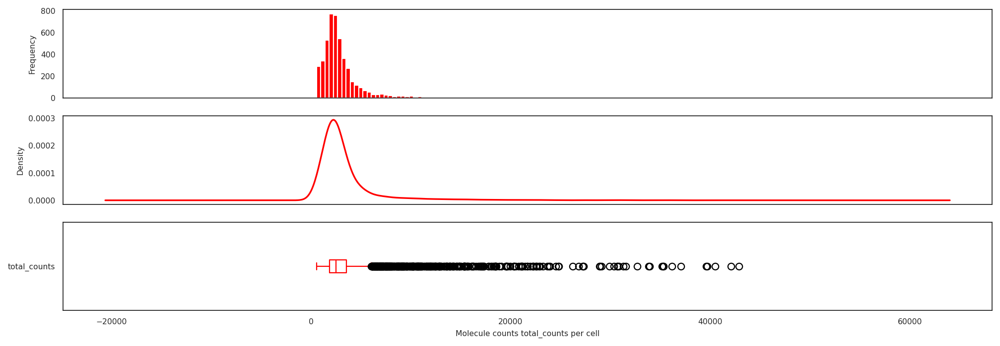

In [30]:
a = adata.copy()
a.obs['total_counts'] =  np.sum(a.layers['raw'], axis=1)
total_molecules_per_cell(a, 'total_counts')

In [31]:
if save_adata ==True:
    adata.write(save_path)
    print(save_path)

/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts.h5ad


## attach .obs and cluster

In [40]:
#data paths
adata_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts.h5ad'
adata_obs_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_leukocytes_scran_clustered_annotated_imputed_hvg10000_and_marker_genes_imputed_B.h5ad'
#adata with important obs elements
adata_save_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_clustered.h5ad'


#obs elements to attach from all TIL data
obs_list = [ 'batch', 'primary_tumor', 'Limited', 'PValue_emptydrops', 'FDR_emptydrops', 
            'total_molecules', 'percent_mito', 'pheno_var_k10', 'pheno_var_k20', 'pheno_var_k30', 
            'pheno_var_k40', 'pheno_var_k50', 'pheno_var_k60', 'pheno_var_k70', 'pheno_var_k80', 
            'pheno_var_k90', 'pheno_var_k100', 'major_subsets']

#clustering parameters 
pheno_names = ['pheno_B_k10', 'pheno_B_k20', 'pheno_B_k30', 'pheno_B_k40', 'pheno_B_k50', 'pheno_B_k60',
              'pheno_B_k70','pheno_B_k80','pheno_B_k90','pheno_B_k100']
pheno_k = [10,20,30,40,50,60,70,80,90,100]


In [41]:
adata = sc.read(adata_path)
adata_obs = sc.read(adata_obs_path)

In [42]:
adata

AnnData object with n_obs × n_vars = 4832 × 14068
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'raw'

In [43]:
adata_obs

AnnData object with n_obs × n_vars = 5006 × 18116
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'batch', 'primary_tumor', 'Limited', 'PValue_emptydrops', 'FDR_emptydrops', 'total_molecules', 'percent_mito', 'empty_droplet_sig', 'doublets', 'major_subsets', 'pheno_k10', 'pheno_k20', 'pheno_k30', 'pheno_k40', 'pheno_k50', 'pheno_k60', 'pheno_k70', 'pheno_k80', 'pheno_k90', 'pheno_k100', 'pheno_var_k10', 'pheno_var_k20', 'pheno_var_k30', 'pheno_var_k40', 'pheno_var_k50', 'pheno_var_k60', 'pheno_var_k70', 'pheno_var_k80', 'pheno_var_k90', 'pheno_var_k100'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg', 'major_subsets_colors', 'neighbors', 'pca',

In [44]:
#attach important .obs elements from adata_obs to adata

adatas = [adata]
print('attaching obs elements:')

for i in obs_list:
    adatas[0].obs[i] = adata_obs.obs[i].copy()
    print('attached:', i)
    
adatas

attaching obs elements:
attached: batch
attached: primary_tumor
attached: Limited
attached: PValue_emptydrops
attached: FDR_emptydrops
attached: total_molecules
attached: percent_mito
attached: pheno_var_k10
attached: pheno_var_k20
attached: pheno_var_k30
attached: pheno_var_k40
attached: pheno_var_k50
attached: pheno_var_k60
attached: pheno_var_k70
attached: pheno_var_k80
attached: pheno_var_k90
attached: pheno_var_k100
attached: major_subsets


[AnnData object with n_obs × n_vars = 4832 × 14068
     obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'batch', 'primary_tumor', 'Limited', 'PValue_emptydrops', 'FDR_emptydrops', 'total_molecules', 'percent_mito', 'pheno_var_k10', 'pheno_var_k20', 'pheno_var_k30', 'pheno_var_k40', 'pheno_var_k50', 'pheno_var_k60', 'pheno_var_k70', 'pheno_var_k80', 'pheno_var_k90', 'pheno_var_k100', 'major_subsets'
     var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
     layers: 'raw']

## cluster

In [45]:
adata

AnnData object with n_obs × n_vars = 4832 × 14068
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'batch', 'primary_tumor', 'Limited', 'PValue_emptydrops', 'FDR_emptydrops', 'total_molecules', 'percent_mito', 'pheno_var_k10', 'pheno_var_k20', 'pheno_var_k30', 'pheno_var_k40', 'pheno_var_k50', 'pheno_var_k60', 'pheno_var_k70', 'pheno_var_k80', 'pheno_var_k90', 'pheno_var_k100', 'major_subsets'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'raw'

## PCA neighbors clustering imputation

In [46]:
adata.X

array([[0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 1.1210821, 0.       , ..., 0.       , 0.       ,
        0.       ],
       ...,
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ]], dtype=float32)

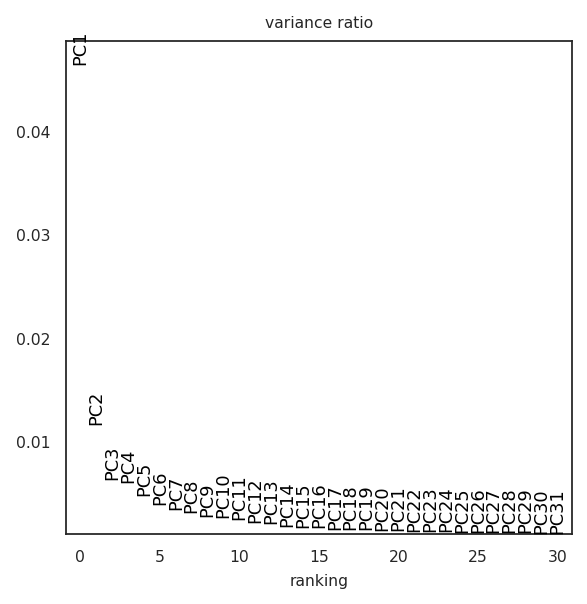

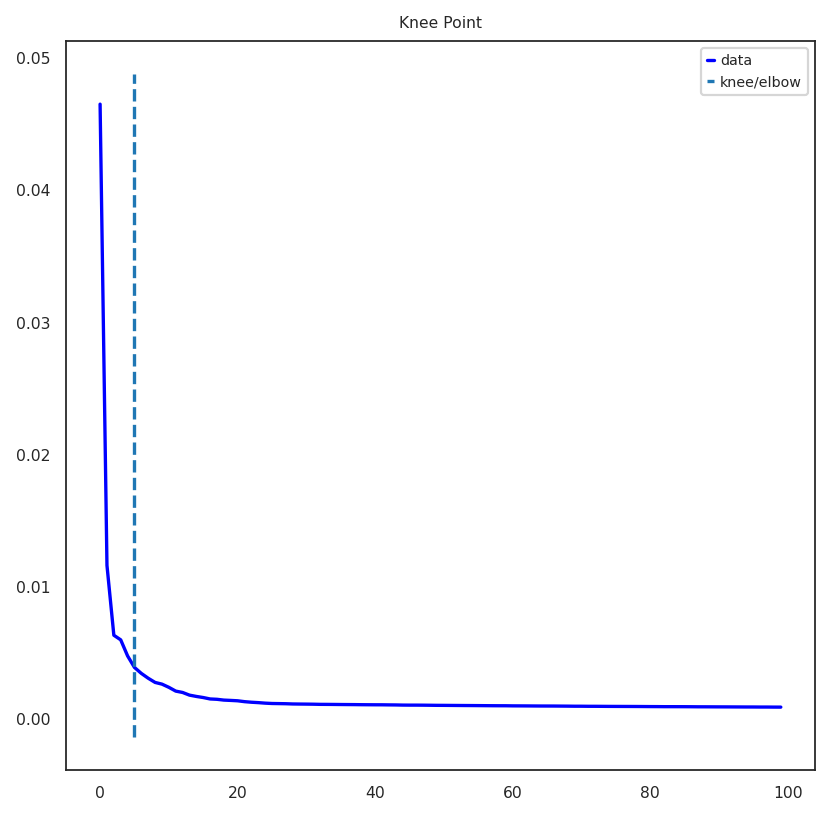

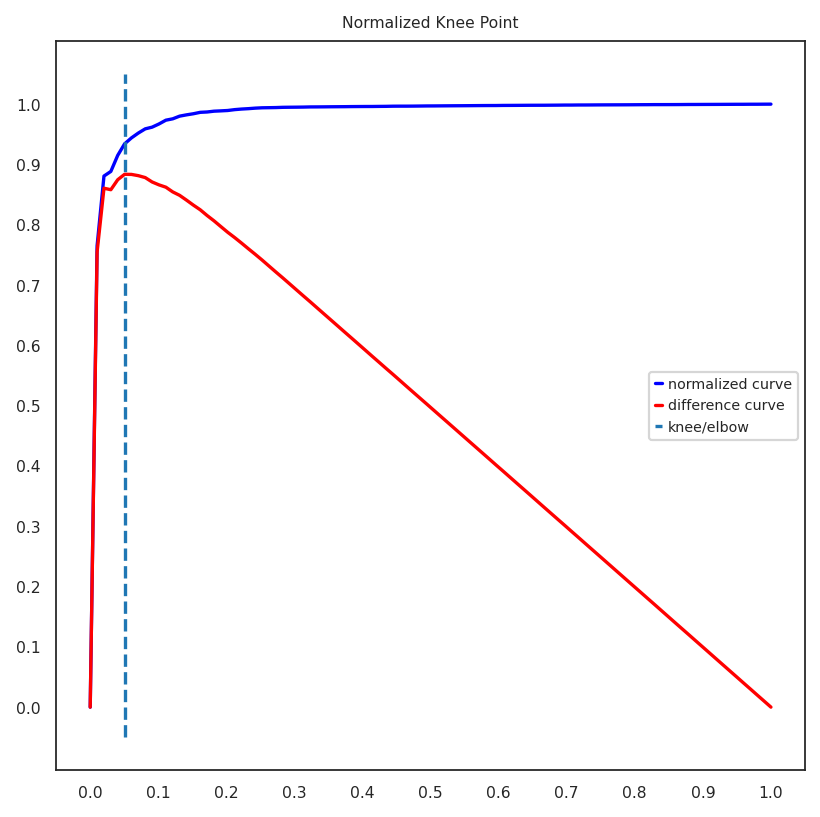

Kneepoint happens at PC: 5
5 PC explain 7.5105019845068455 % of variance
2 PC explain 5.807248502969742 % of variance
3 PC explain 6.438773963600397 % of variance
4 PC explain 7.035393640398979 % of variance
5 PC explain 7.5105019845068455 % of variance
6 PC explain 7.8984878025949 % of variance
7 PC explain 8.241315302439034 % of variance
8 PC explain 8.547576027922332 % of variance
9 PC explain 8.822236000560224 % of variance
10 PC explain 9.083986608311534 % of variance
11 PC explain 9.321638522669673 % of variance
12 PC explain 9.530740696936846 % of variance
13 PC explain 9.729490801692009 % of variance
14 PC explain 9.908064897172153 % of variance
15 PC explain 10.076810838654637 % of variance
16 PC explain 10.23723934777081 % of variance
17 PC explain 10.386917099822313 % of variance
18 PC explain 10.533964622300118 % of variance
19 PC explain 10.675014613661915 % of variance
20 PC explain 10.813643771689385 % of variance
21 PC explain 10.949462093412876 % of variance
22 PC expl

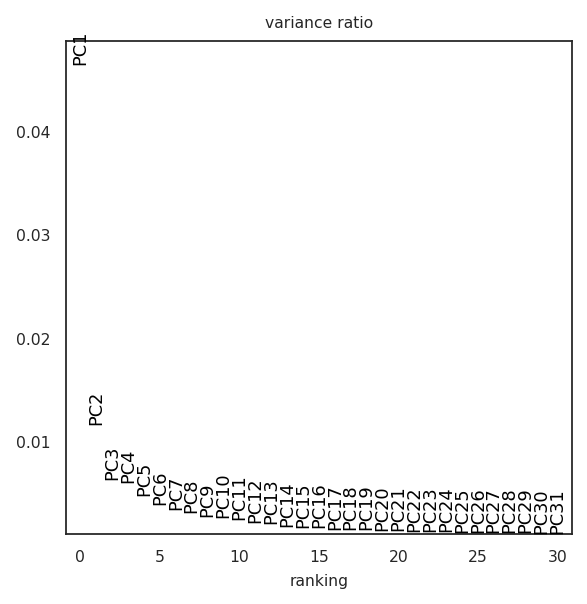

In [47]:
#select optimal number of PCs and recalculate PCs
number_of_PC_used = calculate_optimal_PC(adata, min_PC = 50, min_var=25, n_comps=100, use_hv=None)

In [48]:
sc.pp.neighbors(adata, n_neighbors=10, method= 'umap', n_pcs=number_of_PC_used)
sc.tl.umap(adata)

In [49]:
sc.tl.tsne(adata, random_state = 7, n_pcs=number_of_PC_used)

/home/wallet/miniconda3/envs/2022_Peer_SPADE_cellrank2/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


In [50]:
for j,k in enumerate(pheno_names):
        result_pheno_ndf_all = sce.tl.phenograph(adata.obsm['X_pca'], k = pheno_k[j],seed=1)
        adata.obs[k] = pd.Categorical(result_pheno_ndf_all[0])

Finding 10 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.9094638824462891 seconds
Jaccard graph constructed in 4.589443206787109 seconds
Wrote graph to binary file in 0.022429704666137695 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.853502
After 7 runs, maximum modularity is Q = 0.855646
Louvain completed 27 runs in 1.6866707801818848 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 10.906380414962769 seconds
Finding 20 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.8817853927612305 seconds
Jaccard graph constructed in 3.9266324043273926 seconds
Wrote graph to binary file in 0.0847158432006836 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.828034
Louvain completed 21 runs in 0.9815855026245117 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 9.52125597000122 seconds


In [51]:
a = magic(adata, copy=True, verbose=True, solver= 'exact', n_pca=adata.obsm['X_pca'].shape[1], knn=5, t=3)
adata.layers['imputed'] = a.X

Calculating MAGIC...
  Running MAGIC on 4832 cells and 14068 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 5.18 seconds.
    Calculating KNN search...
    Calculated KNN search in 2.72 seconds.
    Calculating affinities...
    Calculated affinities in 2.68 seconds.
  Calculated graph and diffusion operator in 10.59 seconds.
  Running MAGIC with `solver='exact'` on 14068-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.91 seconds.
Calculated MAGIC in 14.65 seconds.


/home/wallet/.local/lib/python3.10/site-packages/magic/utils.py:145: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  data = anndata.AnnData(data)


### save data

In [52]:
#indicate save path
adata_save_path

'/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_clustered.h5ad'

In [53]:
#save data
adata.write(adata_save_path)
print('adata written to', adata_save_path)

adata written to /data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_clustered.h5ad


# highly variable genes

In [4]:
#data paths
adata_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_clustered.h5ad'

#adata with important obs elements
#adata_save_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_7500hv_clustered.h5ad'
#adata_save_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_5000hv_clustered_v2_230125.h5ad'
#adata_save_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_7500hv_clustered_v2_230125.h5ad'
adata_save_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_10000hv_clustered_v2_230125.h5ad'


#clustering parameters
number_of_hv_genes = 10000
exclude_batch_specific_hv = False
batch_key_tumors = 'batch'
#additional marker genes added to hv?
add_marker_genes = True
marker_gene_path = '/data/peer/wallet/Jupyter/PDAC_RT_Huber_Walle/immune_marker_panel_clean_210216.csv'
marker_gene_sets = ['B_important_marker']

pheno_names = ['pheno_var_B_k10', 'pheno_var_B_k20', 'pheno_var_B_k30', 'pheno_var_B_k40', 'pheno_var_B_k50', 'pheno_var_B_k60',
              'pheno_var_B_k70','pheno_var_B_k80','pheno_var_B_k90','pheno_var_B_k100']
pheno_k = [10,20,30,40,50,60,70,80,90,100]


In [5]:
adata = sc.read(adata_path)

In [9]:
adata.obs['batch']

204765448821084-T12    T12
195546194827510-T01    T01
191647290674460-T15    T15
121276815071078-T15    T15
130134889130915-T01    T01
                      ... 
231280294680412-T15    T15
121965727401692-T15    T15
169158855313251-T23    T23
235122023381406-T15    T15
227846602995501-T06    T06
Name: batch, Length: 4832, dtype: category
Categories (22, object): ['N03', 'T01', 'T02', 'T03', ..., 'T21', 'T22', 'T23', 'T24']

In [10]:
adata.layers['raw']

<4832x14068 sparse matrix of type '<class 'numpy.float32'>'
	with 4937333 stored elements in Compressed Sparse Row format>

### select highly variable genes

In [11]:
if exclude_batch_specific_hv ==True:
    sc.pp.highly_variable_genes(adata, layer='raw', flavor='seurat_v3', n_top_genes=number_of_hv_genes, batch_key=batch_key_tumors)
else:
    sc.pp.highly_variable_genes(adata, layer='raw', flavor='seurat_v3', n_top_genes=number_of_hv_genes)

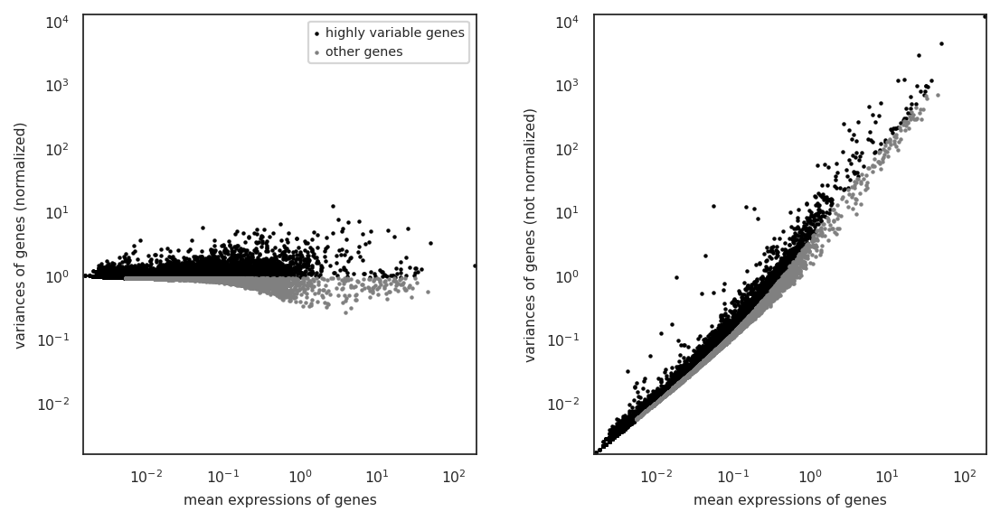

In [12]:
sc.pl.highly_variable_genes(adata, log=True, show=None, save=None, highly_variable_genes=True)

In [13]:
adata

AnnData object with n_obs × n_vars = 4832 × 14068
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'batch', 'primary_tumor', 'Limited', 'PValue_emptydrops', 'FDR_emptydrops', 'total_molecules', 'percent_mito', 'pheno_var_k10', 'pheno_var_k20', 'pheno_var_k30', 'pheno_var_k40', 'pheno_var_k50', 'pheno_var_k60', 'pheno_var_k70', 'pheno_var_k80', 'pheno_var_k90', 'pheno_var_k100', 'major_subsets', 'pheno_B_k10', 'pheno_B_k20', 'pheno_B_k30', 'pheno_B_k40', 'pheno_B_k50', 'pheno_B_k60', 'pheno_B_k70', 'pheno_B_k80', 'pheno_B_k90', 'pheno_B_k100'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'neighbors', 'pca', 'tsne', 'umap', 'hvg'
    obsm: 'X_pca', 'X

## add marker genes to highly variable

In [14]:
if add_marker_genes ==True:
    marker_genes_df = pd.read_csv(marker_gene_path, encoding='latin-1', index_col='gene_name')

In [15]:
#limit to human only
marker_genes_df = marker_genes_df[marker_genes_df['species'] == 'homo_sapiens']
marker_genes_df

,ENSEMBL_Gene,uniprot_ID,protein_name,species,protein_cytoplasm,protein_intracellular,protein_membrane,protein_nucleus,protein_secretory,cytokine,...,viral_entry_positive_reg_evidence,class,notes,UniProtID,UniProt_summary,citation,total_seq_A,total_seq_B,total_seq_C,last_curator
gene_name,,,,,,,,,,,,,,,,,,,,,
ACKR4,ENSG00000129048,NaN,NaN,homo_sapiens,NaN,False,True,False,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ACOD1,ENSG00000102794,NaN,NaN,homo_sapiens,NaN,NaN,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,wallet
ACTA1,ENSG00000143632,NaN,NaN,homo_sapiens,NaN,NaN,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ACTA2,ENSG00000107796,NaN,NaN,homo_sapiens,NaN,NaN,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ADAR,NaN,NaN,NaN,homo_sapiens,NaN,False,False,True,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,wallet
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZEB2,ENSG00000169554,O60315,NaN,homo_sapiens,NaN,True,False,NaN,False,False,...,NaN,marker,NaN,NaN,NaN,https://doi.org/10.1111/imm.12888,FALSE,False,False,wallet
CNTF,ENSG00000242689,NaN,NaN,homo_sapiens,NaN,NaN,NaN,NaN,NaN,True,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CNTFR,ENSG00000122756,NaN,NaN,homo_sapiens,NaN,NaN,NaN,NaN,NaN,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [16]:
#limit to markers used for distinguishing immune from tumor cells
marker_genes_df = marker_genes_df[marker_gene_sets]

In [17]:
marker_genes_df

,B_important_marker
gene_name,
ACKR4,NaN
ACOD1,False
ACTA1,NaN
ACTA2,NaN
ADAR,False
...,...
ZEB2,False
CNTF,NaN
CNTFR,NaN


In [18]:
#extract gene names
marker_lists = []
for i in marker_gene_sets:
    marker_genes_list = list(set(marker_genes_df[marker_genes_df[i]==True].index))
    marker_lists.append(marker_genes_list)
marker_lists

[['IGHG1',
  'AICDA',
  'TACE',
  'IL17B',
  'HLA-DRA',
  'IL17F',
  'IL5',
  'IGHM',
  'CXCR5',
  'HLA-DOB',
  'CSF2',
  'IL4',
  'PDCD1',
  'CXCR3',
  'IGHD',
  'CD38',
  'CXCL13',
  'CD1C',
  'IFNG',
  'TNF',
  'CD40',
  'MME',
  'IGHG4',
  'TLR4',
  'IL12A',
  'CD24',
  'CD69',
  'IL2',
  'CD27',
  'FAS',
  'LTA',
  'TNFRSF13C ',
  'IL13',
  'TGFB2',
  'IL17A',
  'IGHG3',
  'HLA-DMB',
  'CD79B',
  'IL10',
  'IL21R',
  'HLA-DPB1',
  'HLA-DQA1',
  'CD79A',
  'IGHE',
  'CD19',
  'HLA-DMA',
  'GZMB',
  'MKI67',
  'FCER2',
  'CR2',
  'IGHA2',
  'IGHG2',
  'CD80',
  'CD274',
  'HLA-DQB1',
  'MS4A2',
  'MZB1',
  'CCL3',
  'SDC1',
  'IL22',
  'IL6',
  'PRSS3',
  'TCF3',
  'HLA-DPA1',
  'IL12B',
  'TGFB1',
  'EBI3',
  'CD74',
  'LTB',
  'IGHA1',
  'CD86',
  'HLA-DRB4',
  'HLA-DRB3',
  'BCL6',
  'MS4A1']]

In [19]:
#concatenate lists
import itertools
a = marker_lists
marker_genes = list(itertools.chain.from_iterable(a))
marker_genes

['IGHG1',
 'AICDA',
 'TACE',
 'IL17B',
 'HLA-DRA',
 'IL17F',
 'IL5',
 'IGHM',
 'CXCR5',
 'HLA-DOB',
 'CSF2',
 'IL4',
 'PDCD1',
 'CXCR3',
 'IGHD',
 'CD38',
 'CXCL13',
 'CD1C',
 'IFNG',
 'TNF',
 'CD40',
 'MME',
 'IGHG4',
 'TLR4',
 'IL12A',
 'CD24',
 'CD69',
 'IL2',
 'CD27',
 'FAS',
 'LTA',
 'TNFRSF13C ',
 'IL13',
 'TGFB2',
 'IL17A',
 'IGHG3',
 'HLA-DMB',
 'CD79B',
 'IL10',
 'IL21R',
 'HLA-DPB1',
 'HLA-DQA1',
 'CD79A',
 'IGHE',
 'CD19',
 'HLA-DMA',
 'GZMB',
 'MKI67',
 'FCER2',
 'CR2',
 'IGHA2',
 'IGHG2',
 'CD80',
 'CD274',
 'HLA-DQB1',
 'MS4A2',
 'MZB1',
 'CCL3',
 'SDC1',
 'IL22',
 'IL6',
 'PRSS3',
 'TCF3',
 'HLA-DPA1',
 'IL12B',
 'TGFB1',
 'EBI3',
 'CD74',
 'LTB',
 'IGHA1',
 'CD86',
 'HLA-DRB4',
 'HLA-DRB3',
 'BCL6',
 'MS4A1']

In [20]:
#set important marker genes as highly variable

for i in marker_genes:
    if i in adata.var_names:
        adata.var['highly_variable'][i]= True
    else:
        print(i, 'not found')

TACE not found
IL17B not found
IL17F not found
IL5 not found
CSF2 not found
IL4 not found
IFNG not found
IL2 not found
TNFRSF13C  not found
IL13 not found
IL17A not found
MS4A2 not found
IL22 not found
IL12B not found
HLA-DRB4 not found
HLA-DRB3 not found


/scratch/lsftmp/14471221.tmpdir/ipykernel_412134/2651330476.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.var['highly_variable'][i]= True


In [21]:
adata[:,'FASLG'].var['highly_variable']

FASLG    True
Name: highly_variable, dtype: bool

## cluster

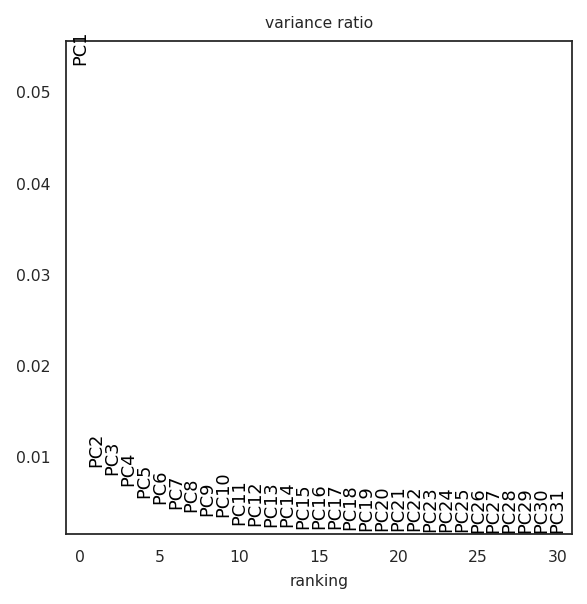

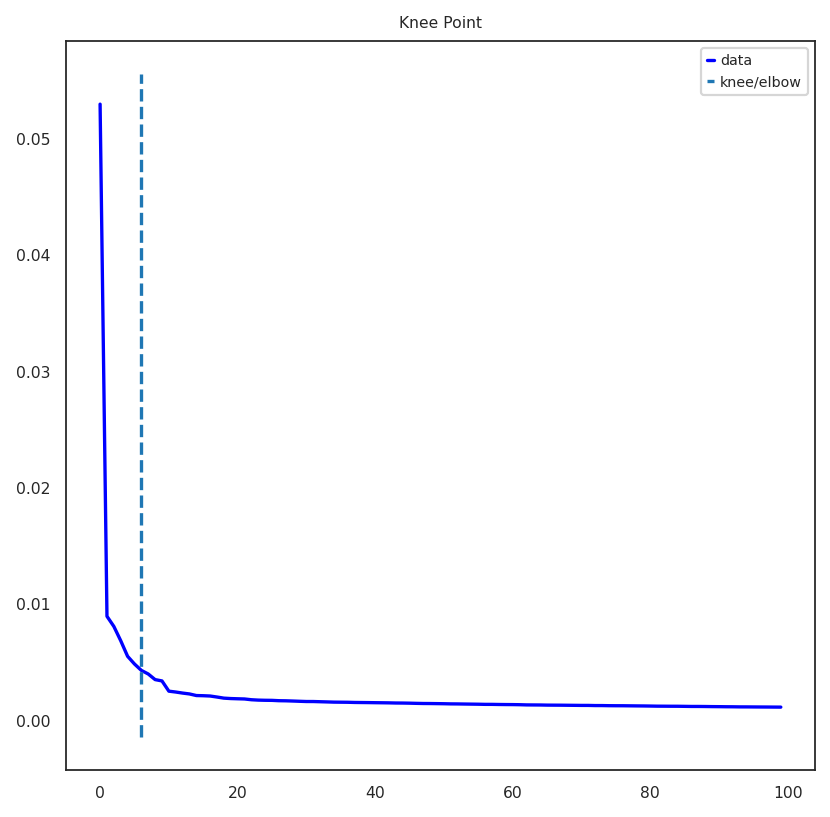

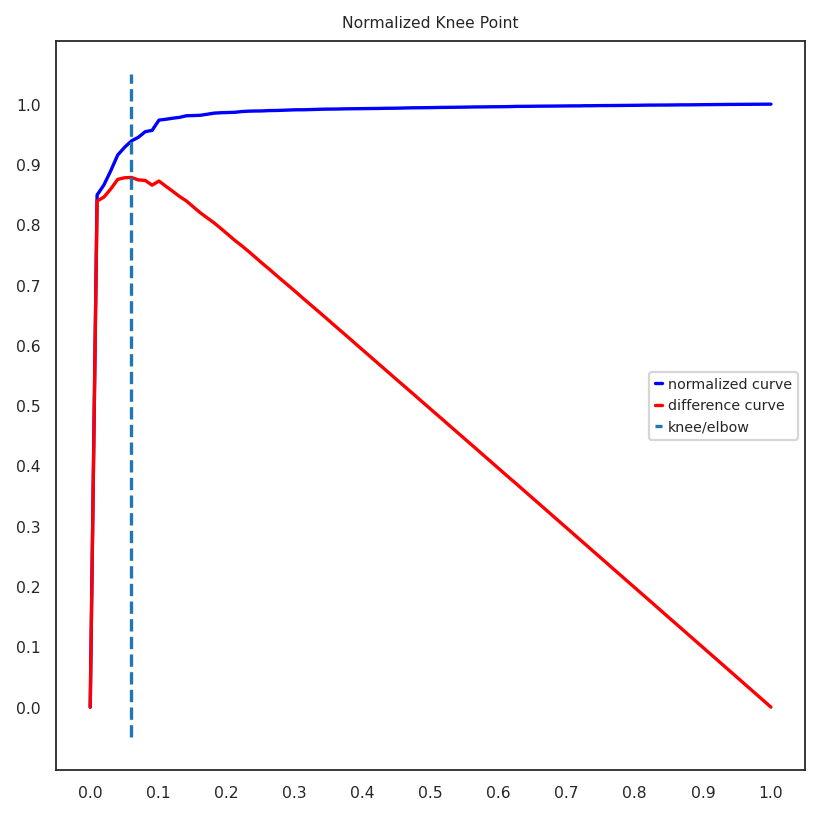

Kneepoint happens at PC: 6
6 PC explain 8.711708663031459 % of variance
2 PC explain 6.189745292067528 % of variance
3 PC explain 6.995920278131962 % of variance
4 PC explain 7.6792242005467415 % of variance
5 PC explain 8.228492038324475 % of variance
6 PC explain 8.711708663031459 % of variance
7 PC explain 9.139826614409685 % of variance
8 PC explain 9.53705720603466 % of variance
9 PC explain 9.886052459478378 % of variance
10 PC explain 10.223604924976826 % of variance
11 PC explain 10.473106685094535 % of variance
12 PC explain 10.715204733423889 % of variance
13 PC explain 10.948286624625325 % of variance
14 PC explain 11.173872416839004 % of variance
15 PC explain 11.385786952450871 % of variance
16 PC explain 11.596168228425086 % of variance
17 PC explain 11.804006015881896 % of variance
18 PC explain 12.003134028054774 % of variance
19 PC explain 12.192710221279413 % of variance
20 PC explain 12.378696876112372 % of variance
21 PC explain 12.562759488355368 % of variance
22 P

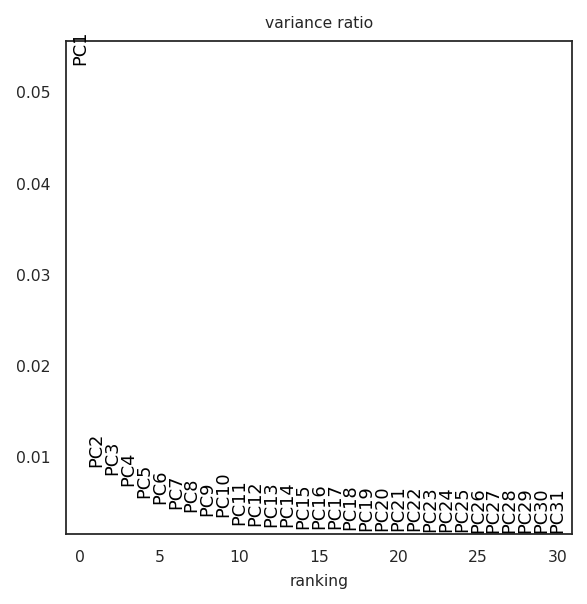

In [22]:
#select optimal number of PCs and recalculate PCs
number_of_PC_used = calculate_optimal_PC(adata, min_PC = 50, min_var=25, n_comps=100, use_hv=None)

In [23]:
sc.pp.neighbors(adata, n_neighbors=10, method= 'umap', n_pcs=number_of_PC_used)
sc.tl.umap(adata)

In [24]:
sc.tl.tsne(adata, random_state = 7, n_pcs=number_of_PC_used)

/home/wallet/miniconda3/envs/2022_Peer_SPADE_cellrank2/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:795: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(


In [25]:
for j,k in enumerate(pheno_names):
        result_pheno_ndf_all = sce.tl.phenograph(adata.obsm['X_pca'], k = pheno_k[j],seed=1)
        adata.obs[k] = pd.Categorical(result_pheno_ndf_all[0])

Finding 10 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1.0473544597625732 seconds
Jaccard graph constructed in 2.995201826095581 seconds
Wrote graph to binary file in 0.019771814346313477 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.781425
After 20 runs, maximum modularity is Q = 0.782627
Louvain completed 40 runs in 1.5596115589141846 seconds
Sorting communities by size, please wait ...
PhenoGraph completed in 8.2452392578125 seconds
Finding 20 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.9519352912902832 seconds
Jaccard graph constructed in 3.479879856109619 seconds
Wrote graph to binary file in 0.04291510581970215 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.730881
After 3 runs, maximum modularity is Q = 0.73296
After 10 runs, maximum modularity is Q = 0.734564
Louvain completed 30 runs in 1.4844470024108887 second

In [26]:
a = magic(adata, copy=True, verbose=True, solver= 'exact', n_pca=adata.obsm['X_pca'].shape[1], knn=5, t=3)
adata.layers['imputed'] = a.X

Calculating MAGIC...
  Running MAGIC on 4832 cells and 14068 genes.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 3.58 seconds.
    Calculating KNN search...
    Calculated KNN search in 2.80 seconds.
    Calculating affinities...
    Calculated affinities in 2.77 seconds.
  Calculated graph and diffusion operator in 9.16 seconds.
  Running MAGIC with `solver='exact'` on 14068-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
  Calculating imputation...
  Calculated imputation in 3.91 seconds.
Calculated MAGIC in 13.23 seconds.


/home/wallet/.local/lib/python3.10/site-packages/magic/utils.py:145: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  data = anndata.AnnData(data)


### save data

In [27]:
#indicate save path
adata_save_path

'/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_10000hv_clustered_v2_230125.h5ad'

In [28]:
#save data
adata.write(adata_save_path)
print('adata written to', adata_save_path)

adata written to /data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_10000hv_clustered_v2_230125.h5ad



# plot results


# plot results

In [6]:
#standard variables
TNK_suffix = '_TNK'
B_suffix = '_Bcell'
M_suffix = '_myeloid'

#pheno_names = ['pheno_B_k10', 'pheno_B_k20', 'pheno_B_k30', 'pheno_B_k40', 'pheno_B_k50', 'pheno_B_k60',
 #             'pheno_B_k70','pheno_B_k80','pheno_B_k90','pheno_B_k100']
pheno_names = ['pheno_var_B_k10', 'pheno_var_B_k20', 'pheno_var_B_k30', 'pheno_var_B_k40', 'pheno_var_B_k50', 'pheno_var_B_k60',
              'pheno_var_B_k70','pheno_var_B_k80','pheno_var_B_k90','pheno_var_B_k100']
continue_with_adata = False

#set variables
#adata_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_10000hv_clustered_v2_230125.h5ad'
#adata_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_7500hv_clustered_v2_230125.h5ad'
adata_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_5000hv_clustered_v2_230125.h5ad'
#adata_path = '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_clustered.h5ad'
markers_plot_M = ['CD68','MRC1','CD14','ID2','TCF4','IRF4','IRF8','IRF7','BATF3','FUT4','CD207','LY6G','CSF3R','TPSAB1','TPSB2','HDC','FUT4','VASP','CSF3R','ACOD1','FFAR4','LY6G','MPO','CTSG','LTF']
markers_plot_TNK = ['CD3D','CD3E','CD3G','CD4','CD8A','TRAC','TRBC1','TRGC1','TRDC','IL2RA','FOXP3','CCR7','SELL','CD27','CD28','CD69','ITGAL','CXCR3','IL2RB','CD58','CD57','NCR1','KLRB1C','PRF1','THY1','IL7R','EOMES','TBX21','IL1R2','CD200R1','TRAIL','ITGA1','ICOS','KLRG1','GATA3','RORA','AHR','TNFSF11','RORC','KIT','ITGA4','IL1R1','IL33']
markers_plot_B = ['MS4A1','CD19','CD27','SDC1','IGHG1','IGHG2B','IGHG2C','IGHG3','IGHA','IGHE','IGHD','IGHM','MKI67']
markers_plot = markers_plot_B

In [7]:
#load subset files
if continue_with_adata == False:
    adata = sc.read(adata_path)

In [8]:
adata


AnnData object with n_obs × n_vars = 4832 × 14068
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'batch', 'primary_tumor', 'Limited', 'PValue_emptydrops', 'FDR_emptydrops', 'total_molecules', 'percent_mito', 'pheno_var_k10', 'pheno_var_k20', 'pheno_var_k30', 'pheno_var_k40', 'pheno_var_k50', 'pheno_var_k60', 'pheno_var_k70', 'pheno_var_k80', 'pheno_var_k90', 'pheno_var_k100', 'major_subsets', 'pheno_B_k10', 'pheno_B_k20', 'pheno_B_k30', 'pheno_B_k40', 'pheno_B_k50', 'pheno_B_k60', 'pheno_B_k70', 'pheno_B_k80', 'pheno_B_k90', 'pheno_B_k100', 'pheno_var_B_k10', 'pheno_var_B_k20', 'pheno_var_B_k30', 'pheno_var_B_k40', 'pheno_var_B_k50', 'pheno_var_B_k60', 'pheno_var_B_k70', 'pheno_var_B_k80', 'pheno_var_B_k90', 'pheno_var_B_k100'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', '

In [9]:
adata.obsm['X_pca'].shape

(4832, 62)

In [17]:
np.sum(adata.uns['pca'][ 'variance_ratio'])

0.25035432

In [12]:
adata.var['highly_variable'].value_counts()

False    9043
True     5025
Name: highly_variable, dtype: int64

In [91]:
adatas = [adata]

In [92]:
#randomize cells for plotting
for i in adatas:
    i = randomize_cells(i)

In [93]:
# Filter out genes not present in single cell data
marker_genes_filtered = []
for marker in markers_plot:
    if marker in adata.var.index:   
        marker_genes_filtered.append(marker)
    else:
        print(marker + ' filtered out')
marker_genes_filtered = list(set(marker_genes_filtered))

IGHG2B filtered out
IGHG2C filtered out
IGHA filtered out


In [94]:
adata.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,batch,primary_tumor,...,pheno_var_B_k10,pheno_var_B_k20,pheno_var_B_k30,pheno_var_B_k40,pheno_var_B_k50,pheno_var_B_k60,pheno_var_B_k70,pheno_var_B_k80,pheno_var_B_k90,pheno_var_B_k100
204765448821084-T12,750,6.621406,1476.316284,7.297982,15.503906,26.970620,43.543475,75.852968,T12,True,...,8,8,6,4,4,4,4,3,3,3
195546194827510-T01,366,5.905362,1180.375732,7.074435,21.954982,37.991952,61.818366,100.000016,T01,True,...,7,11,1,1,1,1,1,1,1,1
191647290674460-T15,1093,6.997596,1728.791016,7.455756,14.024083,24.980022,38.486332,61.545289,T15,True,...,0,0,0,0,0,0,0,0,0,0
121276815071078-T15,1122,7.023759,1745.685791,7.465476,15.546166,27.468869,40.870927,62.819470,T15,True,...,3,1,1,0,0,0,0,0,1,0
130134889130915-T01,359,5.886104,1141.042236,7.040574,23.014783,39.724475,63.891374,100.000000,T01,True,...,7,3,0,0,0,6,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
231280294680412-T15,1536,7.337588,1927.312500,7.564401,14.304353,25.220693,37.918075,58.674426,T15,True,...,3,14,1,0,0,0,0,1,1,1
121965727401692-T15,663,6.498282,1445.457031,7.276873,17.323983,30.822015,47.636348,81.565286,T15,True,...,0,0,0,0,0,0,0,0,0,0
169158855313251-T23,542,6.297109,1300.097290,7.170963,19.497177,33.516363,52.103403,94.117968,T23,True,...,0,0,2,2,2,2,2,2,2,2
235122023381406-T15,788,6.670766,1555.011597,7.349881,17.003355,29.636985,45.516675,73.821467,T15,True,...,3,1,1,0,0,0,0,0,0,0



# plot results

In [95]:
adata.obs['primary_tumor'] = pd.Categorical(adata.obs['primary_tumor'])

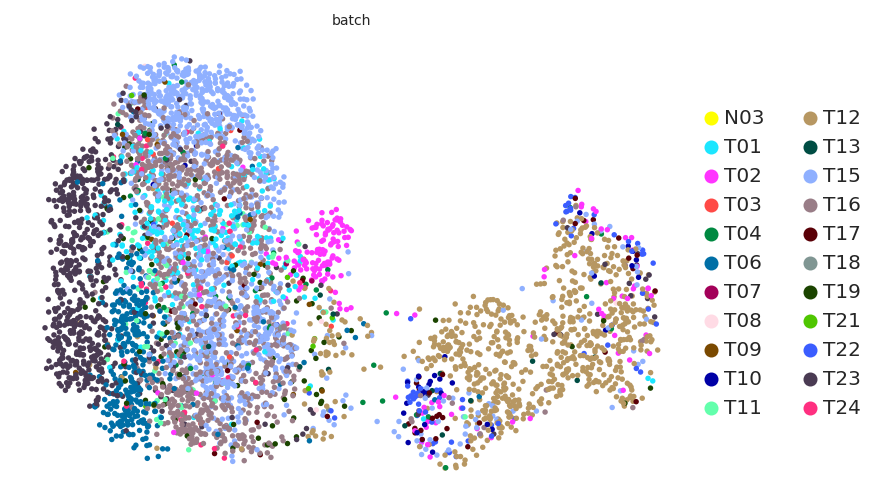

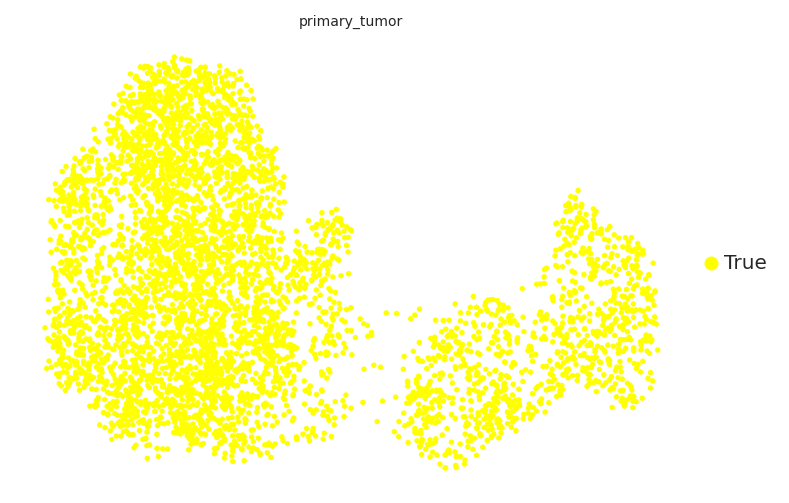

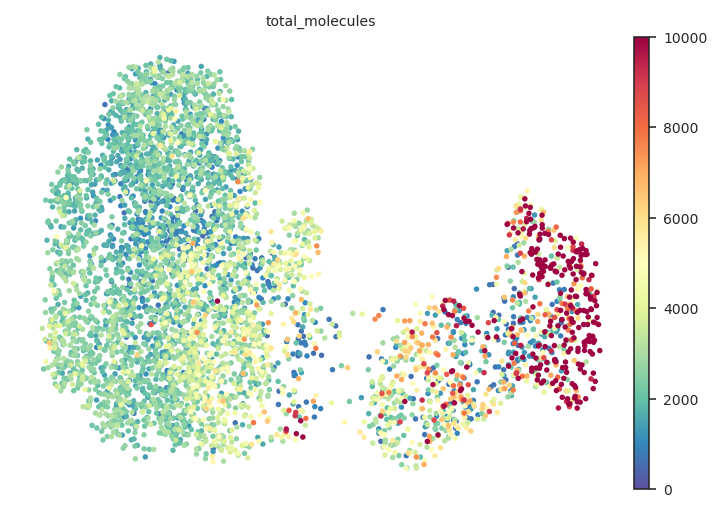

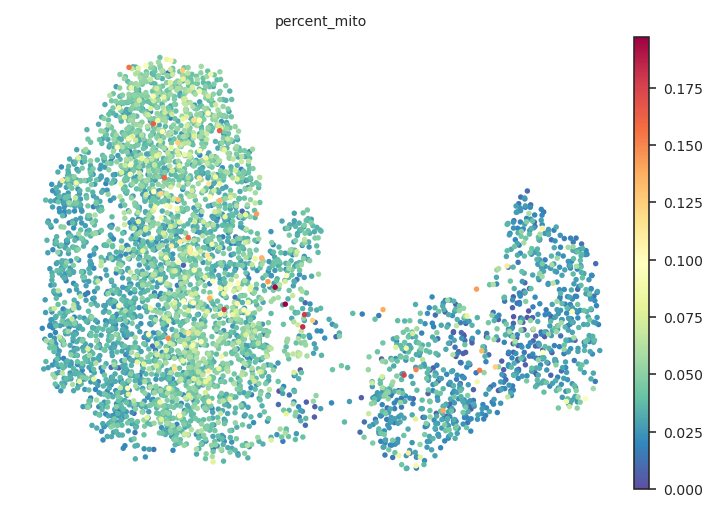

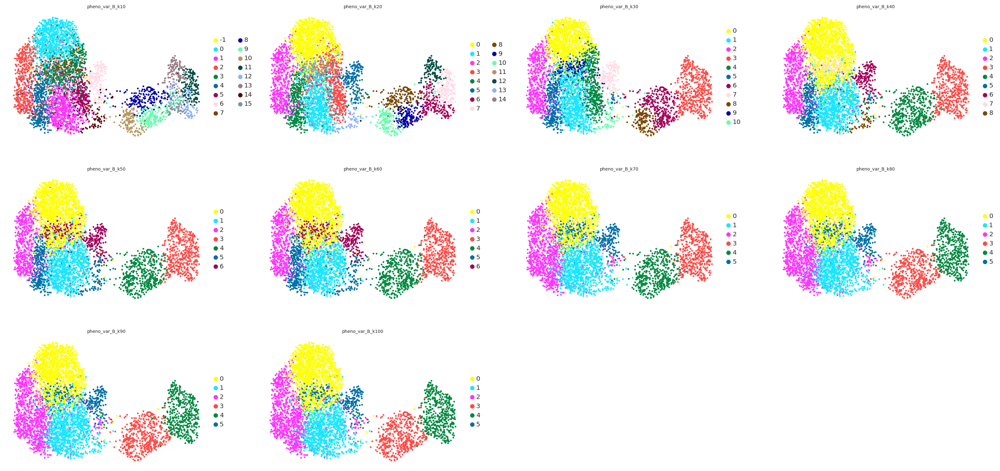

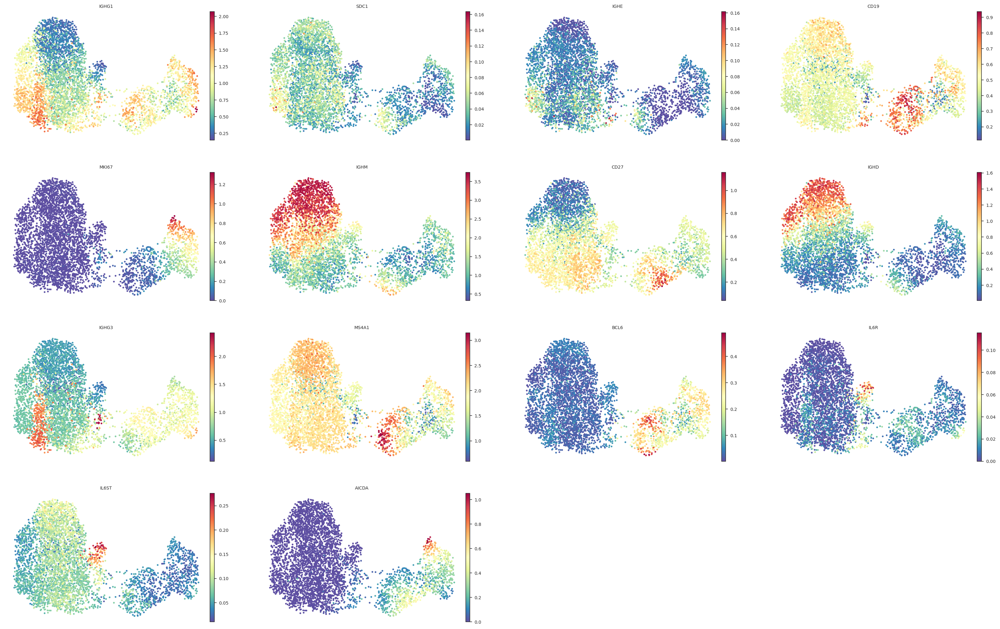

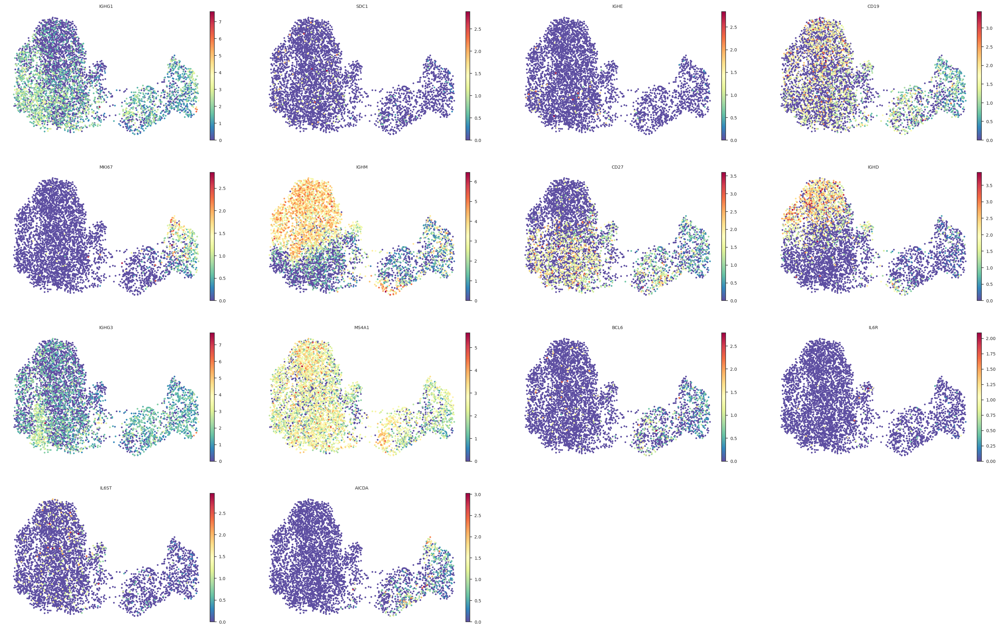

In [96]:
### plot cell subsets
%matplotlib inline
sns.set_style('white')
for i in adatas:
    sc.pl.umap(i, color = ['batch'], s = 30, palette=color_map_clusters, legend_fontsize = 10, vmin=0)
    sc.pl.umap(i, color = ['primary_tumor'], s = 30, palette=color_map_clusters, legend_fontsize = 10, vmin=0)
    sc.pl.umap(i, color = ['total_molecules'], s = 30, cmap='Spectral_r', legend_fontsize = 10, vmin=0, vmax=10000)
    sc.pl.umap(i, color = ['percent_mito'], s = 30, cmap='Spectral_r', legend_fontsize = 10, vmin=0)
    sc.pl.umap(i, color = pheno_names, s = 30, palette=color_map_clusters, legend_fontsize = 10, vmin=0)
    #sc.pl.diffmap(i, color = ['batch'], s = 30, palette=color_map_clusters, legend_fontsize = 10, vmin=0)
    #sc.pl.diffmap(i, color = pheno_names, s = 30, palette=color_map_clusters, legend_fontsize = 10, vmin=0)
    #sc.pl.draw_graph(i, color = ['batch'], s = 30, palette=color_map_clusters, legend_fontsize = 10, vmin=0)
    #sc.pl.draw_graph(i, color = pheno_names, s = 30, palette=color_map_clusters, legend_fontsize = 10, vmin=0)
    #sc.pl.tsne(i, color = ['batch'], s = 30, palette=color_map_clusters, legend_fontsize = 10, vmin=0)
    #sc.pl.tsne(i, color = pheno_names, s = 30, palette=color_map_clusters, legend_fontsize = 10, vmin=0)
    #sc.pl.tsne(i, color = marker_genes_filtered,  layer = 'imputed', s = 30, cmap= 'Spectral_r', legend_fontsize = 10)
    #sc.pl.draw_graph(i, color = marker_genes_filtered,  layer = 'imputed', s = 30, cmap= 'Spectral_r', legend_fontsize = 10)
    sc.pl.umap(i, color = marker_genes_filtered+['BCL6','IL6R','IL6ST','AICDA'],  layer = 'imputed', s = 30, cmap= 'Spectral_r', legend_fontsize = 10)
    sc.pl.umap(i, color = marker_genes_filtered+['BCL6','IL6R','IL6ST','AICDA'],  layer = None, s = 30, cmap= 'Spectral_r', legend_fontsize = 10)

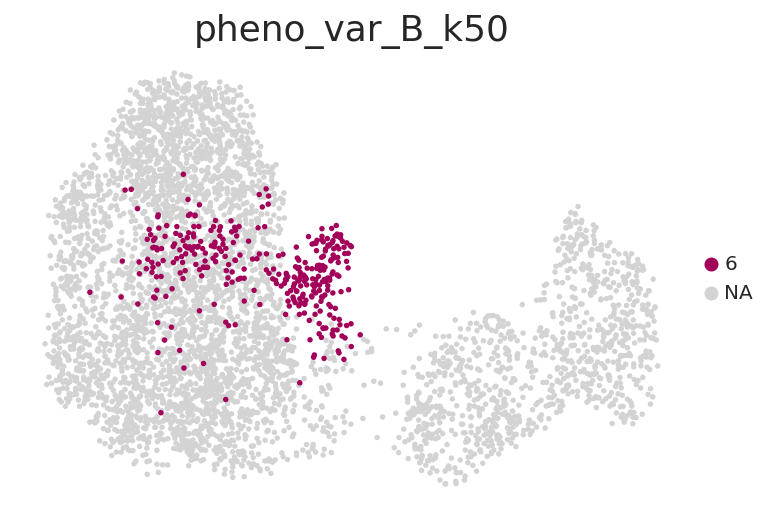

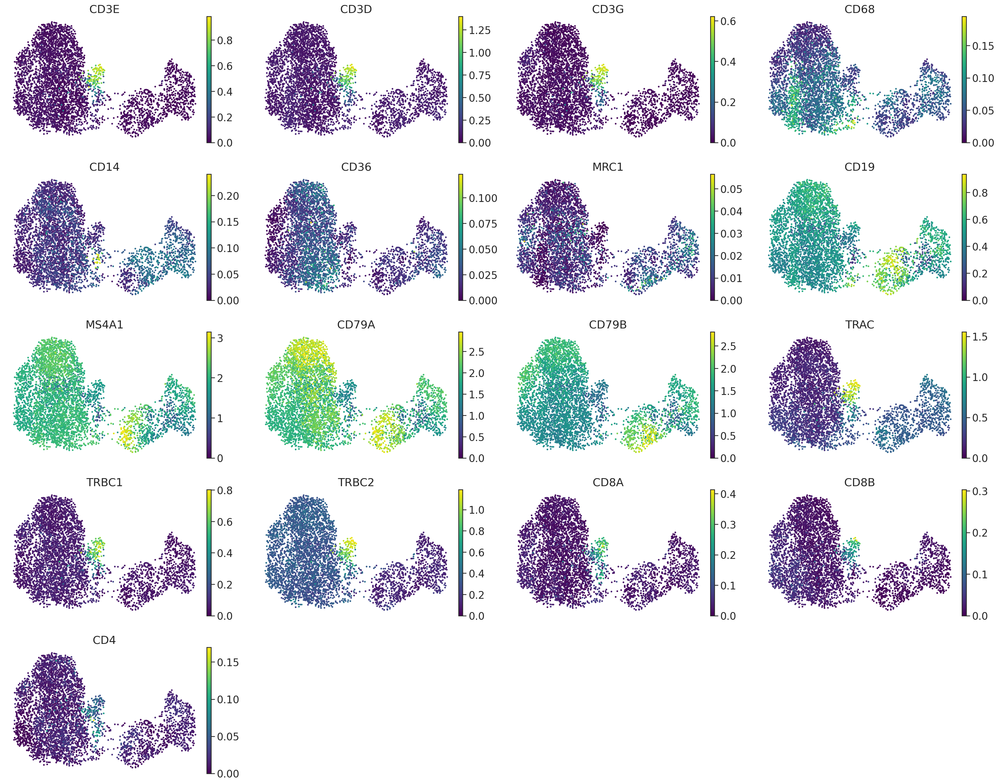

In [122]:
#contaminating T
sc.pl.umap(adata, color = 'pheno_var_B_k50',groups=[6], s = 30, palette=color_map_clusters, legend_fontsize = 10, vmin=0)
sc.pl.umap(adata, color = ['CD3E','CD3D','CD3G','CD68','CD14','CD36',
                        'MRC1','CD19','MS4A1','CD79A','CD79B','TRAC','TRBC1','TRBC2','CD8A','CD8B','CD4'],groups=[6], s = 30, 
           cmap='viridis', legend_fontsize = 10, vmin=0,layer='imputed')

## adjusted rand index

In [97]:
#bootstrap 10000 cells from adata to avoid int overflow,if adata < 100 000 cells use all cells
from sklearn.metrics import adjusted_rand_score

if len(adata.obs_names) > 100000:
    adata_sample = adata[adata.obs.sample(n=100000, replace=False, random_state=1, axis=0).index,:]
else:
    adata_sample = adata

In [98]:
#if you get overflow error that means that the calculation intermediate results are too big to store into np.int64
#this messes up the entire calculatation so you have to downsample the cells
rand_indices = pd.DataFrame(index=pheno_names, columns=pheno_names)

for i in pheno_names:
    for j in pheno_names:
        a = np.int64(np.array(adata_sample.obs[i]))
        b = np.int64(np.array(adata_sample.obs[j]))
        c = adjusted_rand_score(a, b)
        rand_indices.loc[i,j] = c
rand_indices

,pheno_var_B_k10,pheno_var_B_k20,pheno_var_B_k30,pheno_var_B_k40,pheno_var_B_k50,pheno_var_B_k60,pheno_var_B_k70,pheno_var_B_k80,pheno_var_B_k90,pheno_var_B_k100
pheno_var_B_k10,1.0,0.630524,0.583295,0.513346,0.503912,0.503343,0.463587,0.460288,0.457632,0.463387
pheno_var_B_k20,0.630524,1.0,0.769972,0.589362,0.579498,0.569317,0.527076,0.520024,0.541631,0.52135
pheno_var_B_k30,0.583295,0.769972,1.0,0.64151,0.628875,0.613707,0.574328,0.557514,0.582764,0.562817
pheno_var_B_k40,0.513346,0.589362,0.64151,1.0,0.905502,0.894751,0.813216,0.79751,0.76054,0.807074
pheno_var_B_k50,0.503912,0.579498,0.628875,0.905502,1.0,0.92047,0.835673,0.824311,0.787969,0.818665
pheno_var_B_k60,0.503343,0.569317,0.613707,0.894751,0.92047,1.0,0.836605,0.822573,0.778106,0.822663
pheno_var_B_k70,0.463587,0.527076,0.574328,0.813216,0.835673,0.836605,1.0,0.928958,0.887299,0.917398
pheno_var_B_k80,0.460288,0.520024,0.557514,0.79751,0.824311,0.822573,0.928958,1.0,0.919081,0.955295
pheno_var_B_k90,0.457632,0.541631,0.582764,0.76054,0.787969,0.778106,0.887299,0.919081,1.0,0.927318
pheno_var_B_k100,0.463387,0.52135,0.562817,0.807074,0.818665,0.822663,0.917398,0.955295,0.927318,1.0


<AxesSubplot:>

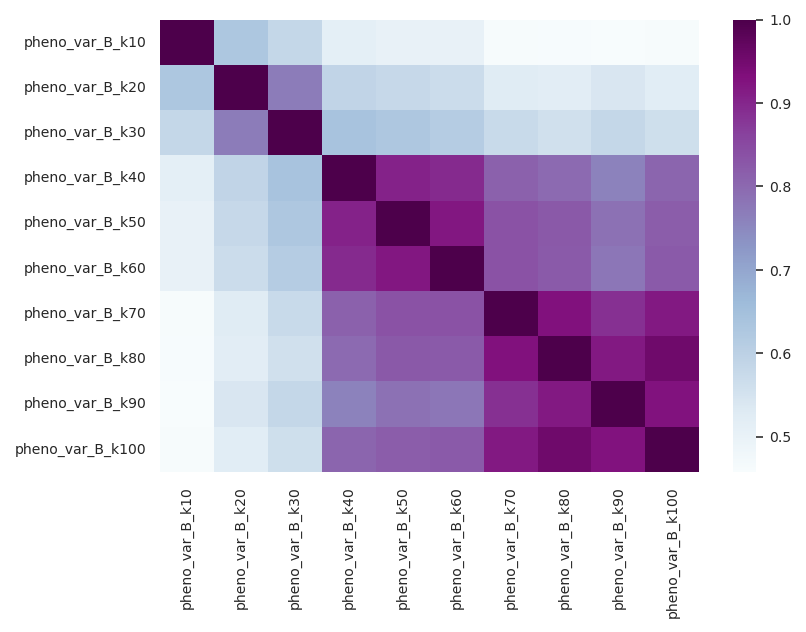

In [99]:
#plot rand indices
sns.heatmap(rand_indices.astype('float'),
                    cmap='BuPu',
                    cbar=True,
                    yticklabels=True,
                    xticklabels=True,
                  # vmax=1,
                   # center=0.5,
                    #vmin=0)
            )

# typing heatmaps

In [101]:
#define adata, clusters and marker genes for heatmaps here
#adata_typing_path = '/data/peer/wallet/Jupyter/2020_Peer_PDAC_dev_Lowe/PDAC_dev_Lowe_final_samples_krasprog_shIL33_scran_TNK_scran_raw_element_obs_element_clustered.h5ad'
adata_typing_path =  '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_5000hv_clustered_v2_230125.h5ad'
pheno_heat = 'pheno_var_B_k50'
save_path_heat = '/data/peer/wallet/Jupyter/2020_Peer_PDAC_dev_Lowe/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_5000hv_clustered_v2_230125_heatmap_zscored_cells.csv'
continue_with_adata = False

#define marker genes
load_marker_genes = False
marker_genes_path = '/data/peer/wallet/Jupyter/2020_Peer_PDAC_dev_Lowe/gene_sets/PDAC_Lowe_TILC_markers.csv' #path of marker gene csv file with gene column
gene_column_name = 'gene_name' #name of column in csv file where gene names are located

#define visualization parameters
layer_heat_imputed = True
z_score_cluster = False
cluster_minus_one_present = False #when PhenoGraph cannot put cells into a cluster it will label these cells with -1, if this is True these cells will not be plotted in the heatmaps
z_score_cells = True #if True gene expression will be z scored across cells and average z score per cluster will be calculated, if false average gene expression per cluster will be calculated and z scored across clusters

#dictionary containing major subtype identities
cluster_marker_dict_overlap = {'B':list(range(19))} #dictionary holding overlap gene sets

In [102]:
#if needed custom marker genes

marker_genes_custom = ['ADD1',
'AIFM3',
'ANKH',
'ANXA1',
'APP',
'ATF3',
'AVPR1A',
'BAX',
'BCAP31',
'BCL10',
'BCL2L1',
'BCL2L10',
'BCL2L11',
'BCL2L2',
'BGN',
'BID',
'BIK',
'BIRC3',
'BMF',
'BMP2',
'BNIP3L',
'BRCA1',
'BTG2',
'BTG3',
'CASP1',
'CASP2',
'CASP3',
'CASP4',
'CASP6',
'CASP7',
'CASP8',
'CASP9',
'CAV1',
'CCNA1',
'CCND1',
'CCND2',
'CD14',
'CD2',
'CD38',
'CD44',
'CD69',
'CDC25B',
'CDK2',
'CDKN1A',
'CDKN1B',
'CFLAR',
'CLU',
'CREBBP',
'CTH',
'CTNNB1',
'CYLD',
'DAP',
'DAP3',
'DCN',
'DDIT3',
'DFFA',
'DIABLO',
'DNAJA1',
'DNAJC3',
'DNM1L',
'DPYD',
'EBP',
'EGR3',
'EMP1',
'ENO2',
'ERBB2',
'ERBB3',
'EREG',
'ETF1',
'F2',
'F2R',
'FAS',
'FASLG',
'FDXR',
'FEZ1',
'GADD45A',
'GADD45B',
'GCH1',
'GNA15',
'GPX1',
'GPX3',
'GPX4',
'GSN',
'GSR',
'GSTM1',
'GUCY2D',
'H1-0',
'HGF',
'HMGB2',
'HMOX1',
'HSPB1',
'IER3',
'IFITM3',
'IFNB1',
'IFNGR1',
'IGF2R',
'IGFBP6',
'IL18',
'IL1A',
'IL1B',
'IL6',
'IRF1',
'ISG20',
'JUN',
'KRT18',
'LEF1',
'LGALS3',
'LMNA',
'LUM',
'MADD',
'MCL1',
'MGMT',
'MMP2',
'NEDD9',
'NEFH',
'PAK1',
'PDCD4',
'PDGFRB',
'PEA15',
'PLAT',
'PLCB2',
'PLPPR4',
'PMAIP1',
'PPP2R5B',
'PPP3R1',
'PPT1',
'PRF1',
'PSEN1',
'PSEN2',
'PTK2',
'RARA',
'RELA',
'RETSAT',
'RHOB',
'RHOT2',
'RNASEL',
'ROCK1',
'SAT1',
'SATB1',
'SC5D',
'SLC20A1',
'SMAD7',
'SOD1',
'SOD2',
'SPTAN1',
'SQSTM1',
'TAP1',
'TGFB2',
'TGFBR3',
'TIMP1',
'TIMP2',
'TIMP3',
'TNF',
'TNFRSF12A',
'TNFSF10',
'TOP2A',
'TSPO',
'TXNIP',
'VDAC2',
'WEE1',
'XIAP']

In [103]:
##### load marker genes

if load_marker_genes ==True:
    marker_genes_df = pd.read_csv(marker_genes_path)
    ##add additional genes of interest here
    interesting_genes= ['Il33','IL1RL1','CD44']
    #extract gene names and combine lists
    marker_genes = list(marker_genes_df.loc[:,gene_column_name])
    marker_genes = marker_genes + interesting_genes
    marker_genes = list(set(marker_genes))
else:
    marker_genes = list(set(marker_genes_custom))
        

In [104]:
#load anndata
if continue_with_adata == False:
    adata = sc.read(adata_typing_path)
adata

AnnData object with n_obs × n_vars = 4832 × 14068
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'batch', 'primary_tumor', 'Limited', 'PValue_emptydrops', 'FDR_emptydrops', 'total_molecules', 'percent_mito', 'pheno_var_k10', 'pheno_var_k20', 'pheno_var_k30', 'pheno_var_k40', 'pheno_var_k50', 'pheno_var_k60', 'pheno_var_k70', 'pheno_var_k80', 'pheno_var_k90', 'pheno_var_k100', 'major_subsets', 'pheno_B_k10', 'pheno_B_k20', 'pheno_B_k30', 'pheno_B_k40', 'pheno_B_k50', 'pheno_B_k60', 'pheno_B_k70', 'pheno_B_k80', 'pheno_B_k90', 'pheno_B_k100', 'pheno_var_B_k10', 'pheno_var_B_k20', 'pheno_var_B_k30', 'pheno_var_B_k40', 'pheno_var_B_k50', 'pheno_var_B_k60', 'pheno_var_B_k70', 'pheno_var_B_k80', 'pheno_var_B_k90', 'pheno_var_B_k100'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', '

In [105]:
# Filter out genes not present in single cell data
marker_genes_filtered = []
for marker in marker_genes:
    if marker in adata.var.index:   
        marker_genes_filtered.append(marker)
    else:
        print(marker + ' filtered out')

CCNA1 filtered out
F2 filtered out
H1-0 filtered out
IL1A filtered out
PLPPR4 filtered out
GUCY2D filtered out
IFNB1 filtered out
NEFH filtered out


In [106]:
marker_genes_filtered

['TIMP2',
 'CD2',
 'CTH',
 'MGMT',
 'GPX3',
 'GADD45B',
 'PPP2R5B',
 'CD38',
 'CDKN1A',
 'TNF',
 'XIAP',
 'BCAP31',
 'IL1B',
 'EBP',
 'BGN',
 'ANKH',
 'BCL2L10',
 'IL18',
 'BCL10',
 'KRT18',
 'CASP9',
 'MADD',
 'CYLD',
 'PPT1',
 'EGR3',
 'MMP2',
 'CASP1',
 'IFITM3',
 'LUM',
 'ISG20',
 'LGALS3',
 'CFLAR',
 'RETSAT',
 'NEDD9',
 'ENO2',
 'IGFBP6',
 'GADD45A',
 'F2R',
 'BMF',
 'EMP1',
 'IRF1',
 'BID',
 'SAT1',
 'SATB1',
 'BIK',
 'PLCB2',
 'BRCA1',
 'HMOX1',
 'CASP8',
 'PSEN1',
 'PTK2',
 'PDCD4',
 'PPP3R1',
 'MCL1',
 'BCL2L11',
 'TOP2A',
 'TXNIP',
 'DIABLO',
 'SQSTM1',
 'GSR',
 'RHOB',
 'GPX1',
 'APP',
 'BTG3',
 'RELA',
 'SMAD7',
 'SLC20A1',
 'PDGFRB',
 'CCND1',
 'PMAIP1',
 'IGF2R',
 'TAP1',
 'FASLG',
 'TSPO',
 'CTNNB1',
 'FEZ1',
 'RHOT2',
 'TGFBR3',
 'ERBB2',
 'GNA15',
 'DAP3',
 'CCND2',
 'DNM1L',
 'GSTM1',
 'CDKN1B',
 'CASP2',
 'BNIP3L',
 'IFNGR1',
 'HMGB2',
 'TNFRSF12A',
 'DNAJA1',
 'BIRC3',
 'ETF1',
 'GSN',
 'PEA15',
 'RARA',
 'DNAJC3',
 'DPYD',
 'HSPB1',
 'ROCK1',
 'FAS',
 'ATF3',
 'BT

In [107]:
if z_score_cells == False and z_score_cluster == False:
    
    ## calculate means for each cluster and export to dataframe
    all_cells_df_clean = adata.obs[pheno_heat] 
    clusters_cells_clean = list(set(all_cells_df_clean.values))
    
    ## remove -1 cells not belonging to any cluster
    if cluster_minus_one_present == True:
        clusters_cells_clean.remove(-1) #optional if -1 in heatmap
    
    ## create empty dataframe
    marker_df = pd.DataFrame(index=clusters_cells_clean, columns=marker_genes_filtered)
    marker_df = marker_df.astype('float') 
    
    ## select imputed or raw layer 
    if layer_heat_imputed == True:
        gene_expression_zscored = pd.DataFrame(
        adata.layers['imputed'], index=adata.obs_names, columns=adata.var_names)
    else:
        gene_expression_zscored = pd.DataFrame(
        adata.X, index=adata.obs_names, columns=adata.var_names)

    for i in clusters_cells_clean:
        print('Cluster: ',i)
        cluster_adata = all_cells_df_clean[all_cells_df_clean==i]
        cluster_adata2 = gene_expression_zscored.loc[cluster_adata.index, :]
        for j in marker_genes_filtered:
            marker_df.loc[i,:] = np.mean(cluster_adata2, axis=0)
            
    %matplotlib inline
    
    # drop na columns
    marker_df = marker_df.dropna(axis=1, how='any', thresh=None, subset=None, inplace=False)
    
    # drop all zero columns
    non_zero = (marker_df != 0).any(axis=0)
    marker_df = marker_df[non_zero.index[non_zero]]#drop zeros columns bc SD will be 0 --> cant divide with 0 for z score
    
    # set color scale
    divnorm = colors.DivergingNorm(vmin=-1, vcenter=0, vmax=1)
    marker_df = marker_df.astype(float) #  gene expression means x pheno cluster matrix
    sns.set(font_scale = 2) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
    sns.clustermap(marker_df, cmap='bwr', col_cluster=True, figsize=(50,10), vmax=3, z_score= False, norm=divnorm) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib

In [109]:
if z_score_cells == True and z_score_cluster == False:   
    
    ## calculate means for each cluster and export to dataframe
    all_cells_df_clean = adata.obs[pheno_heat] 
    clusters_cells_clean = list(set(all_cells_df_clean.values))
    
    ## remove -1 cells not belonging to any cluster
    if cluster_minus_one_present == True:
        clusters_cells_clean.remove(-1) #optional if -1 in heatmap
        
    ## create empty dataframe
    marker_df = pd.DataFrame(index=clusters_cells_clean, columns=marker_genes_filtered)
    marker_df = marker_df.astype('float')
 
    ## select imputed or raw layer   
    if layer_heat_imputed == True:
        gene_expression_zscored = pd.DataFrame(scipy.stats.zscore(adata.layers['imputed'],axis=0), index=adata.obs_names, columns=adata.var_names) # create zscored gene expression df
    else:
        gene_expression_zscored = pd.DataFrame(scipy.stats.zscore(adata.X, axis=0), index=adata.obs_names, columns=adata.var_names)
        
    for i in clusters_cells_clean:
        print('Cluster: ',i)
        cluster_adata = all_cells_df_clean[all_cells_df_clean==i]
        cluster_adata2 = gene_expression_zscored.loc[cluster_adata.index, :]
        for j in marker_genes_filtered:
            marker_df.loc[i,:] = np.mean(cluster_adata2, axis=0)

    %matplotlib inline

    # drop na columns
    marker_df = marker_df.dropna(axis=1, how='any', thresh=None, subset=None, inplace=False)

    # drop all zero columns
    non_zero = (marker_df != 0).any(axis=0)
    marker_df = marker_df[non_zero.index[non_zero]]#drop zeros columns bc SD will be 0 --> cant divide with 0 for z score

    # set color scale
    marker_df = marker_df.astype(float) #  gene expression means x pheno cluster matrix
    sns.set(font_scale = 2) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
    sns.clustermap(marker_df, cmap='bwr', col_cluster=True, figsize=(100,40), vmin=-2,center=0,vmax=2, z_score=None) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib

Cluster:  0
Cluster:  1
Cluster:  2
Cluster:  3
Cluster:  4
Cluster:  5
Cluster:  6


In [110]:
if z_score_cluster ==True and z_score_cluster == False:
    ## calculate means for each cluster and export to dataframe
    all_cells_df_clean = adata.obs[pheno_heat] 
    clusters_cells_clean = list(set(all_cells_df_clean.values))
    
    ## remove -1 cells not belonging to any cluster
    if cluster_minus_one_present == True:
        clusters_cells_clean.remove(-1) #optional if -1 in heatmap
    
    ## create empty dataframe
    marker_df = pd.DataFrame(index=clusters_cells_clean, columns=marker_genes_filtered)
    marker_df = marker_df.astype('float') 
    
    ## select imputed or raw layer 
    if layer_heat_imputed == True:
        gene_expression_zscored = pd.DataFrame(
        adata.layers['imputed'], index=adata.obs_names, columns=adata.var_names)
    else:
        gene_expression_zscored = pd.DataFrame(
        adata.X, index=adata.obs_names, columns=adata.var_names)

    for i in clusters_cells_clean:
        print('Cluster: ',i)
        cluster_adata = all_cells_df_clean[all_cells_df_clean==i]
        cluster_adata2 = gene_expression_zscored.loc[cluster_adata.index, :]
        for j in marker_genes_filtered:
            marker_df.loc[i,:] = np.mean(cluster_adata2, axis=0)
            
    %matplotlib inline
    
    # drop na columns
    marker_df = marker_df.dropna(axis=1, how='any', thresh=None, subset=None, inplace=False)
    
    # drop all zero columns
    non_zero = (marker_df != 0).any(axis=0)
    marker_df = marker_df[non_zero.index[non_zero]]#drop zeros columns bc SD will be 0 --> cant divide with 0 for z score
    
    # set color scale
    divnorm = colors.DivergingNorm(vmin=-1, vcenter=0, vmax=1)
    marker_df = marker_df.astype(float) #  gene expression means x pheno cluster matrix
    sns.set(font_scale = 2) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib
    sns.clustermap(marker_df, cmap='bwr', col_cluster=True, figsize=(50,10), vmax=3, z_score= 1, norm=divnorm) # if error matplotlib has no attribute DivergingNorm appears update Matplotlib

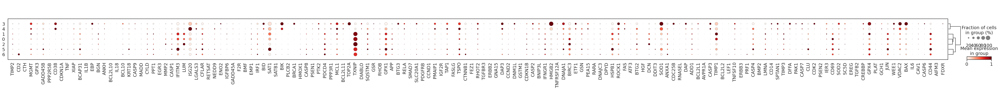

In [111]:
#dotplot
%matplotlib inline
sns.set(font_scale = 1.5)
sns.set_style('white')
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, marker_genes_filtered, groupby=pheno_heat, dendrogram=True, standard_scale='var')

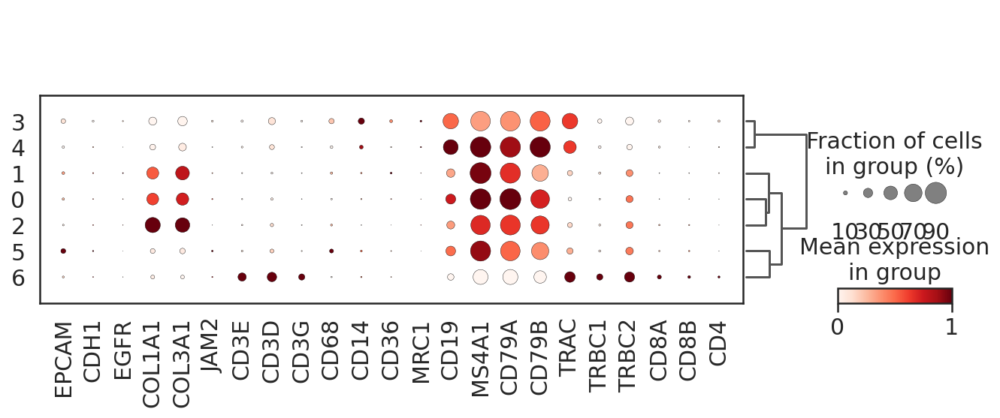

In [117]:
#dotplot
%matplotlib inline
sns.set(font_scale = 1.5)
sns.set_style('white')
contamination_markers = ['EPCAM','CDH1','EGFR','COL1A1','COL3A1','JAM2','PECAM','CD3E','CD3D','CD3G','CD68','CD14','CD36',
                        'MRC1','CD19','MS4A1','CD79A','CD79B','TRAC','TRBC1','TRBC2','CD8A','CD8B','CD4']
contamination_markers_clean = [x for x in contamination_markers if x in adata.var_names]
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, contamination_markers_clean, groupby=pheno_heat, dendrogram=True, standard_scale='var')

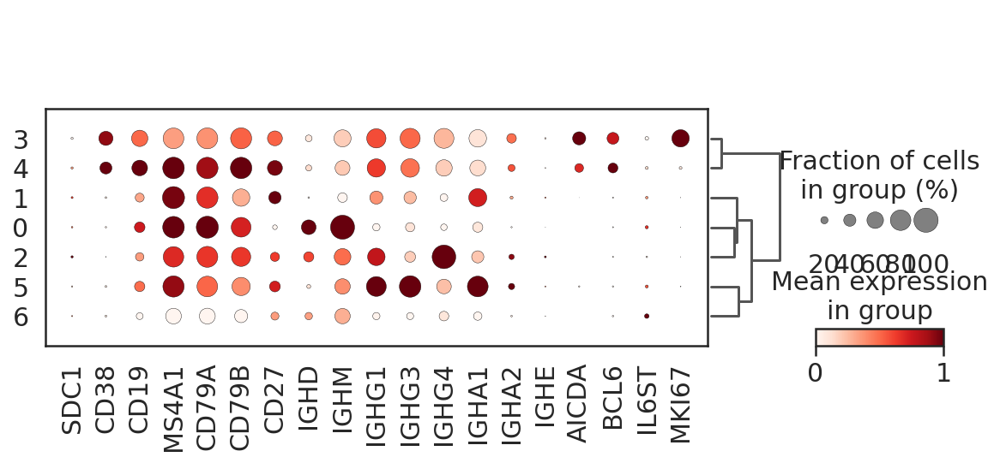

In [123]:
#dotplot
%matplotlib inline
sns.set(font_scale = 1.5)
sns.set_style('white')
contamination_markers = ['SDC1','CD38','CD19','MS4A1','CD79A','CD79B','CD27','IGHD','IGHM','IGHG1','IGHG2A','IGHG2B',
                        'IGHG3','IGHG4','IGHA1','IGHA2','IGHE','AICDA','BCL6','IL6ST','MKI67']
contamination_markers_clean = [x for x in contamination_markers if x in adata.var_names]
sc.tl.dendrogram(adata, groupby=pheno_heat)
sc.pl.dotplot(adata, contamination_markers_clean, groupby=pheno_heat, dendrogram=True, standard_scale='var')

In [131]:
'B-memory-non-switched' in list(G.celltypes)

True

In [125]:
import cytopus as cp
G = cp.kb.KnowledgeBase()
G.celltypes

KnowledgeBase object containing 75 cell types and 201 cellular processes



['gran',
 'capillary',
 'cDC',
 'Mac',
 'CD4-T',
 'B-pb-t2',
 'carcinoma-cell',
 'B-pb-mature',
 'cDC2',
 'mono',
 'TCM',
 'NSCLC-carcinoma-cell',
 'B-memory-switched',
 'GC-B',
 'mo-DC',
 'lung-epi',
 'cDC1',
 'B',
 'CD8-T_KLRG1neg-effector',
 'NK',
 'fibro',
 'B-memory-IgM-MZ',
 'ILC2',
 'TEM',
 'T-naive',
 'CD56dim-NK',
 'TRM',
 'ILC',
 'TSCM',
 'ILC1',
 'CD8-T',
 'M',
 'colon-epi',
 'eosino',
 'smooth-muscle',
 'all-cells',
 'epi',
 'B-pb-t1',
 'mast',
 'B-memory',
 'DC',
 'ILC3-NCRpos',
 'ILC3-NCRneg',
 'CD56bright-NK',
 'TNK',
 'B-memory-non-switched',
 'plasma-blast',
 'endo',
 'endo-systemic-venous',
 'cDC3',
 'NK-adaptive',
 'MDC',
 'FDC',
 'ILC3',
 'baso',
 'lung-endo-venous',
 'Lti',
 'TFH',
 'Treg',
 'B-memory-DN',
 'endo-aerocyte',
 'endo-arterial',
 'crc-carcinoma-cell',
 'Langerhans',
 'T',
 'CD8-T-progenitor-exhausted',
 'gdT',
 'leukocyte',
 'B-naive',
 'neutro',
 'plasma',
 'endo-lymphatic',
 'p-DC',
 'lung-smooth-muscle',
 'CD8-T_KLRG1pos-effector']

In [112]:
# save to csv
marker_df.to_csv(save_path_heat) # otherwise will write a first column with index 0

In [113]:
adata

AnnData object with n_obs × n_vars = 4832 × 14068
    obs: 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'batch', 'primary_tumor', 'Limited', 'PValue_emptydrops', 'FDR_emptydrops', 'total_molecules', 'percent_mito', 'pheno_var_k10', 'pheno_var_k20', 'pheno_var_k30', 'pheno_var_k40', 'pheno_var_k50', 'pheno_var_k60', 'pheno_var_k70', 'pheno_var_k80', 'pheno_var_k90', 'pheno_var_k100', 'major_subsets', 'pheno_B_k10', 'pheno_B_k20', 'pheno_B_k30', 'pheno_B_k40', 'pheno_B_k50', 'pheno_B_k60', 'pheno_B_k70', 'pheno_B_k80', 'pheno_B_k90', 'pheno_B_k100', 'pheno_var_B_k10', 'pheno_var_B_k20', 'pheno_var_B_k30', 'pheno_var_B_k40', 'pheno_var_B_k50', 'pheno_var_B_k60', 'pheno_var_B_k70', 'pheno_var_B_k80', 'pheno_var_B_k90', 'pheno_var_B_k100'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', '

# Annotate cells

In [134]:
#define adata, clusters and marker genes for heatmaps here
adata_path =  '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_5000hv_clustered_v2_230125.h5ad'
adata_save_path =  '/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_5000hv_clustered_v2_230125_annotated.h5ad'
pheno_annotate = 'pheno_var_B_k50'
continue_with_adata = False

In [135]:
if continue_with_adata == False:
    adata = sc.read(adata_path)

In [136]:
adata.obs['pheno_var_B_k50']

204765448821084-T12    4
195546194827510-T01    1
191647290674460-T15    0
121276815071078-T15    0
130134889130915-T01    0
                      ..
231280294680412-T15    0
121965727401692-T15    0
169158855313251-T23    2
235122023381406-T15    0
227846602995501-T06    0
Name: pheno_var_B_k50, Length: 4832, dtype: category
Categories (7, int64): [0, 1, 2, 3, 4, 5, 6]

In [137]:
#create unique subset cluster names to later merge with in one .obs column with the other subsets (B, M..)
pheno_k10_subset_list = [i+j for i,j in zip(len(adata.obs[pheno_annotate])*['B_'], list(map(str, adata.obs[pheno_annotate])))]

In [138]:
#add to .obs element
adata.obs['pheno_annotate'] = pheno_k10_subset_list

In [139]:
set(adata.obs['pheno_annotate'])

{'B_0', 'B_1', 'B_2', 'B_3', 'B_4', 'B_5', 'B_6'}

In [140]:
#mappings

##subtype_1

subtype_1_dict = {0:'B-naive',
    1:'B-memory-switched',
        2:'B-memory-non-switched',
            3:'GC-B',
                4:'GC-B',
                    5:'B-memory-switched',           
    6:'B-T_doublet'}

subtype_2_dict = {0:'B-naive',
    1:'B-memory-switched',
        2:'B-memory-non-switched',
            3:'GC-B_proliferating',
                4:'GC-B',
                    5:'B-memory-switched',           
    6:'B-T_doublet'}

#subtype_3_dict = 

In [141]:
#map with dictionary
adata.obs['annotation_level_0'] = ['BP']*len(adata.obs[pheno_annotate])
adata.obs['annotation_level_1'] = adata.obs[pheno_annotate].map(subtype_1_dict)
adata.obs['annotation_level_2'] = adata.obs[pheno_annotate].map(subtype_2_dict)

In [143]:
set(adata.obs['annotation_level_0'])

{'BP'}

In [144]:
set(adata.obs['annotation_level_1'])

{'B-T_doublet',
 'B-memory-non-switched',
 'B-memory-switched',
 'B-naive',
 'GC-B'}

In [145]:
set(adata.obs['annotation_level_2'])

{'B-T_doublet',
 'B-memory-non-switched',
 'B-memory-switched',
 'B-naive',
 'GC-B',
 'GC-B_proliferating'}

In [146]:
adata_save_path

'/data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_5000hv_clustered_v2_230125_annotated.h5ad'

In [147]:
adata.write(adata_save_path)
print('AnnData object saved to:', adata_save_path)

AnnData object saved to: /data/peer/wallet/Jupyter/PAAD-X-Peng_Sun-X-2019-X-10.1038s41422-019-0195-y-X-Jupyter/output_data/2021_PDAC_RT_Huber_Walle_B_scran_raw_counts_annotated_5000hv_clustered_v2_230125_annotated.h5ad
